In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata = read_adata("data/JuloVelo_pre.h5ad")
adata.uns["iroot"] = 0

0

In [6]:
normalize(adata)

AnnData object 3696 ✕ 2000

In [7]:
filter_and_gene_kinetics_predetermination(adata; filter_criteria = 0.3)

[ Info: 531 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 78 genes are filtered due to bad kinetics
[ Info: See adata.var[!, "bad_kinetics_genes"] for details
[ Info: 1391 genes are used to infer velocity
[ Info: See adata.var[!, "train_genes"] for details


AnnData object 3696 ✕ 2000

In [8]:
reshape_data(adata)

[ Info: Data is reshaped to (2, 3696, 1391)


AnnData object 3696 ✕ 2000

In [9]:
Kinetics = build_velocity_model(adata)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 1391, leakyrelu),  # 417_300 parameters
  SpatialDense(100 => 100, depth = 1391, leakyrelu),  # 14_049_100 parameters
  SpatialDense(100 => 3, depth = 1391, σ),  # 421_473 parameters
)                   # Total: 6 arrays, 14_887_873 parameters, 56.793 MiB.

In [10]:
density_sampling(adata; sample_number = 2000)

[ Info: Sample 2000 cells


AnnData object 3696 ✕ 2000

In [11]:
train(adata, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/pancreas/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 104695.93f0, penalty = 4867.129f0, AvgMeanCos = 0.9624f0)
Epoch: 1  Train: (cos_loss = 102161.47f0, penalty = 4866.8354f0, AvgMeanCos = 0.9633f0)
Epoch: 2  Train: (cos_loss = 99297.375f0, penalty = 4866.542f0, AvgMeanCos = 0.9643f0)
Epoch: 3  Train: (cos_loss = 97138.41f0, penalty = 4866.2476f0, AvgMeanCos = 0.9651f0)
Epoch: 4  Train: (cos_loss = 95203.67f0, penalty = 4865.9517f0, AvgMeanCos = 0.9658f0)
Epoch: 5  Train: (cos_loss = 93495.77f0, penalty = 4865.6553f0, AvgMeanCos = 0.9664f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 92145.266f0, penalty = 4865.3584f0, AvgMeanCos = 0.9669f0)
Epoch: 7  Train: (cos_loss = 91304.266f0, penalty = 4865.0605f0, AvgMeanCos = 0.9672f0)
Epoch: 8  Train: (cos_loss = 90567.55f0, penalty = 4864.763f0, AvgMeanCos = 0.9674f0)
Epoch: 9  Train: (cos_loss = 89816.8f0, penalty = 4864.467f0, AvgMeanCos = 0.9677f0)
Epoch: 10  Train: (cos_loss = 89071.375f0, penalty = 4864.1704f0, AvgMeanCos = 0.968f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 88322.516f0, penalty = 4863.873f0, AvgMeanCos = 0.9683f0)
Epoch: 12  Train: (cos_loss = 87591.31f0, penalty = 4863.5767f0, AvgMeanCos = 0.9685f0)
Epoch: 13  Train: (cos_loss = 86883.33f0, penalty = 4863.279f0, AvgMeanCos = 0.9688f0)
Epoch: 14  Train: (cos_loss = 86195.05f0, penalty = 4862.9805f0, AvgMeanCos = 0.969f0)
Epoch: 15  Train: (cos_loss = 85555.56f0, penalty = 4862.68f0, AvgMeanCos = 0.9692f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 84945.59f0, penalty = 4862.379f0, AvgMeanCos = 0.9695f0)
Epoch: 17  Train: (cos_loss = 84368.57f0, penalty = 4862.075f0, AvgMeanCos = 0.9697f0)
Epoch: 18  Train: (cos_loss = 83832.4f0, penalty = 4861.769f0, AvgMeanCos = 0.9699f0)
Epoch: 19  Train: (cos_loss = 83325.414f0, penalty = 4861.461f0, AvgMeanCos = 0.97f0)
Epoch: 20  Train: (cos_loss = 82835.87f0, penalty = 4861.151f0, AvgMeanCos = 0.9702f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 82387.03f0, penalty = 4860.8384f0, AvgMeanCos = 0.9704f0)
Epoch: 22  Train: (cos_loss = 81968.734f0, penalty = 4860.5234f0, AvgMeanCos = 0.9705f0)
Epoch: 23  Train: (cos_loss = 81578.7f0, penalty = 4860.205f0, AvgMeanCos = 0.9707f0)
Epoch: 24  Train: (cos_loss = 81197.92f0, penalty = 4859.8853f0, AvgMeanCos = 0.9708f0)
Epoch: 25  Train: (cos_loss = 80835.99f0, penalty = 4859.5625f0, AvgMeanCos = 0.9709f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 80496.24f0, penalty = 4859.238f0, AvgMeanCos = 0.9711f0)
Epoch: 27  Train: (cos_loss = 80167.34f0, penalty = 4858.91f0, AvgMeanCos = 0.9712f0)
Epoch: 28  Train: (cos_loss = 79854.24f0, penalty = 4858.582f0, AvgMeanCos = 0.9713f0)
Epoch: 29  Train: (cos_loss = 79556.16f0, penalty = 4858.252f0, AvgMeanCos = 0.9714f0)
Epoch: 30  Train: (cos_loss = 79269.02f0, penalty = 4857.919f0, AvgMeanCos = 0.9715f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 78987.64f0, penalty = 4857.583f0, AvgMeanCos = 0.9716f0)
Epoch: 32  Train: (cos_loss = 78728.69f0, penalty = 4857.247f0, AvgMeanCos = 0.9717f0)
Epoch: 33  Train: (cos_loss = 78494.04f0, penalty = 4856.909f0, AvgMeanCos = 0.9718f0)
Epoch: 34  Train: (cos_loss = 78257.03f0, penalty = 4856.57f0, AvgMeanCos = 0.9719f0)
Epoch: 35  Train: (cos_loss = 78037.984f0, penalty = 4856.2275f0, AvgMeanCos = 0.9719f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 77830.336f0, penalty = 4855.8857f0, AvgMeanCos = 0.972f0)
Epoch: 37  Train: (cos_loss = 77631.57f0, penalty = 4855.5415f0, AvgMeanCos = 0.9721f0)
Epoch: 38  Train: (cos_loss = 77438.51f0, penalty = 4855.1978f0, AvgMeanCos = 0.9722f0)
Epoch: 39  Train: (cos_loss = 77265.46f0, penalty = 4854.852f0, AvgMeanCos = 0.9722f0)
Epoch: 40  Train: (cos_loss = 77102.25f0, penalty = 4854.5063f0, AvgMeanCos = 0.9723f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 76941.86f0, penalty = 4854.16f0, AvgMeanCos = 0.9723f0)
Epoch: 42  Train: (cos_loss = 76786.516f0, penalty = 4853.813f0, AvgMeanCos = 0.9724f0)
Epoch: 43  Train: (cos_loss = 76635.97f0, penalty = 4853.4653f0, AvgMeanCos = 0.9725f0)
Epoch: 44  Train: (cos_loss = 76493.17f0, penalty = 4853.116f0, AvgMeanCos = 0.9725f0)
Epoch: 45  Train: (cos_loss = 76354.73f0, penalty = 4852.767f0, AvgMeanCos = 0.9726f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 76216.99f0, penalty = 4852.415f0, AvgMeanCos = 0.9726f0)
Epoch: 47  Train: (cos_loss = 76084.02f0, penalty = 4852.0625f0, AvgMeanCos = 0.9727f0)
Epoch: 48  Train: (cos_loss = 75959.15f0, penalty = 4851.71f0, AvgMeanCos = 0.9727f0)
Epoch: 49  Train: (cos_loss = 75833.11f0, penalty = 4851.3545f0, AvgMeanCos = 0.9727f0)
Epoch: 50  Train: (cos_loss = 75712.26f0, penalty = 4851.0f0, AvgMeanCos = 0.9728f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 75593.484f0, penalty = 4850.6426f0, AvgMeanCos = 0.9728f0)
Epoch: 52  Train: (cos_loss = 75478.875f0, penalty = 4850.285f0, AvgMeanCos = 0.9729f0)
Epoch: 53  Train: (cos_loss = 75369.24f0, penalty = 4849.927f0, AvgMeanCos = 0.9729f0)
Epoch: 54  Train: (cos_loss = 75261.78f0, penalty = 4849.5674f0, AvgMeanCos = 0.9729f0)
Epoch: 55  Train: (cos_loss = 75157.484f0, penalty = 4849.2065f0, AvgMeanCos = 0.973f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 75053.38f0, penalty = 4848.8457f0, AvgMeanCos = 0.973f0)
Epoch: 57  Train: (cos_loss = 74953.08f0, penalty = 4848.4844f0, AvgMeanCos = 0.9731f0)
Epoch: 58  Train: (cos_loss = 74855.195f0, penalty = 4848.1216f0, AvgMeanCos = 0.9731f0)
Epoch: 59  Train: (cos_loss = 74763.555f0, penalty = 4847.7593f0, AvgMeanCos = 0.9731f0)
Epoch: 60  Train: (cos_loss = 74669.27f0, penalty = 4847.3955f0, AvgMeanCos = 0.9732f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 74578.12f0, penalty = 4847.0317f0, AvgMeanCos = 0.9732f0)
Epoch: 62  Train: (cos_loss = 74487.84f0, penalty = 4846.666f0, AvgMeanCos = 0.9732f0)
Epoch: 63  Train: (cos_loss = 74398.2f0, penalty = 4846.3013f0, AvgMeanCos = 0.9733f0)
Epoch: 64  Train: (cos_loss = 74309.805f0, penalty = 4845.9355f0, AvgMeanCos = 0.9733f0)
Epoch: 65  Train: (cos_loss = 74222.22f0, penalty = 4845.569f0, AvgMeanCos = 0.9733f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 74139.77f0, penalty = 4845.2017f0, AvgMeanCos = 0.9734f0)
Epoch: 67  Train: (cos_loss = 74058.836f0, penalty = 4844.8345f0, AvgMeanCos = 0.9734f0)
Epoch: 68  Train: (cos_loss = 73974.45f0, penalty = 4844.466f0, AvgMeanCos = 0.9734f0)
Epoch: 69  Train: (cos_loss = 73894.266f0, penalty = 4844.096f0, AvgMeanCos = 0.9734f0)
Epoch: 70  Train: (cos_loss = 73820.59f0, penalty = 4843.727f0, AvgMeanCos = 0.9735f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 73746.59f0, penalty = 4843.358f0, AvgMeanCos = 0.9735f0)
Epoch: 72  Train: (cos_loss = 73663.55f0, penalty = 4842.988f0, AvgMeanCos = 0.9735f0)
Epoch: 73  Train: (cos_loss = 73591.86f0, penalty = 4842.6177f0, AvgMeanCos = 0.9735f0)
Epoch: 74  Train: (cos_loss = 73522.51f0, penalty = 4842.2466f0, AvgMeanCos = 0.9736f0)
Epoch: 75  Train: (cos_loss = 73453.18f0, penalty = 4841.875f0, AvgMeanCos = 0.9736f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 73381.08f0, penalty = 4841.5034f0, AvgMeanCos = 0.9736f0)
Epoch: 77  Train: (cos_loss = 73311.13f0, penalty = 4841.1304f0, AvgMeanCos = 0.9736f0)
Epoch: 78  Train: (cos_loss = 73243.055f0, penalty = 4840.758f0, AvgMeanCos = 0.9737f0)
Epoch: 79  Train: (cos_loss = 73174.07f0, penalty = 4840.385f0, AvgMeanCos = 0.9737f0)
Epoch: 80  Train: (cos_loss = 73107.53f0, penalty = 4840.0117f0, AvgMeanCos = 0.9737f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 73040.97f0, penalty = 4839.638f0, AvgMeanCos = 0.9737f0)
Epoch: 82  Train: (cos_loss = 72975.73f0, penalty = 4839.2637f0, AvgMeanCos = 0.9738f0)
Epoch: 83  Train: (cos_loss = 72909.97f0, penalty = 4838.891f0, AvgMeanCos = 0.9738f0)
Epoch: 84  Train: (cos_loss = 72843.875f0, penalty = 4838.517f0, AvgMeanCos = 0.9738f0)
Epoch: 85  Train: (cos_loss = 72780.65f0, penalty = 4838.1436f0, AvgMeanCos = 0.9738f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 72719.445f0, penalty = 4837.7695f0, AvgMeanCos = 0.9739f0)
Epoch: 87  Train: (cos_loss = 72660.52f0, penalty = 4837.395f0, AvgMeanCos = 0.9739f0)
Epoch: 88  Train: (cos_loss = 72601.95f0, penalty = 4837.0195f0, AvgMeanCos = 0.9739f0)
Epoch: 89  Train: (cos_loss = 72542.43f0, penalty = 4836.6445f0, AvgMeanCos = 0.9739f0)
Epoch: 90  Train: (cos_loss = 72480.875f0, penalty = 4836.269f0, AvgMeanCos = 0.9739f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 72418.7f0, penalty = 4835.8936f0, AvgMeanCos = 0.974f0)
Epoch: 92  Train: (cos_loss = 72358.84f0, penalty = 4835.5186f0, AvgMeanCos = 0.974f0)
Epoch: 93  Train: (cos_loss = 72303.1f0, penalty = 4835.143f0, AvgMeanCos = 0.974f0)
Epoch: 94  Train: (cos_loss = 72248.87f0, penalty = 4834.767f0, AvgMeanCos = 0.974f0)
Epoch: 95  Train: (cos_loss = 72192.84f0, penalty = 4834.391f0, AvgMeanCos = 0.974f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 72137.51f0, penalty = 4834.0156f0, AvgMeanCos = 0.9741f0)
Epoch: 97  Train: (cos_loss = 72079.72f0, penalty = 4833.64f0, AvgMeanCos = 0.9741f0)
Epoch: 98  Train: (cos_loss = 72021.77f0, penalty = 4833.2646f0, AvgMeanCos = 0.9741f0)
Epoch: 99  Train: (cos_loss = 71966.92f0, penalty = 4832.889f0, AvgMeanCos = 0.9741f0)
Epoch: 100  Train: (cos_loss = 71914.766f0, penalty = 4832.512f0, AvgMeanCos = 0.9742f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 1391, leakyrelu),  # 417_300 parameters
  SpatialDense(100 => 100, depth = 1391, leakyrelu),  # 14_049_100 parameters
  SpatialDense(100 => 3, depth = 1391, σ),  # 421_473 parameters
)                   # Total: 6 arrays, 14_887_873 parameters, 56.793 MiB.

In [12]:
velocity_estimation(adata, Kinetics)

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [13]:
compute_cell_velocity(adata)

AnnData object 3696 ✕ 2000

In [14]:
estimate_pseudotime(adata, 2, n_repeat = 3)

[ Info: Start estimate pseudotime, it may take a long time.
Generating Trajectories: 100%|████████| 11088/11088 [00:00<00:00, 11213.22it/s]


Pseudo random number generator seeds are set to:  [0, 1, 2]
There are 2 clusters.
[0 1]
--- 10.523593187332153 seconds ---


AnnData object 3696 ✕ 2000

In [15]:
write_adata(adata, filename = "data/JuloVelo")

# Plot figure

## Gene kinetics

In [16]:
palattes = Dict("Ductal"=> "#8fbc8f",
 "Ngn3 low EP"=> "#f4a460",
 "Ngn3 high EP"=> "#fdbf6f",
 "Pre-endocrine"=> "#ff7f00",
 "Beta"=> "#b2df8a",
 "Alpha"=> "#1f78b4",
 "Delta"=> "#6a3d9a",
 "Epsilon"=> "#cab2d6")

Dict{String, String} with 8 entries:
  "Ductal"        => "#8fbc8f"
  "Pre-endocrine" => "#ff7f00"
  "Ngn3 low EP"   => "#f4a460"
  "Beta"          => "#b2df8a"
  "Ngn3 high EP"  => "#fdbf6f"
  "Epsilon"       => "#cab2d6"
  "Delta"         => "#6a3d9a"
  "Alpha"         => "#1f78b4"

In [17]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [18]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [19]:
GR.setarrowsize(0.5)

In [20]:
X = adata.uns["X"];
velocity = adata.uns["velocity"]
genes = adata.var_names[adata.var[!, "train_genes"]]
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype));

In [21]:
idx = findfirst(x -> x == "Actn4", genes)

1097

In [22]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([0.02455860100592431 0.05263157894736842; -0.05263157894736842 -0.031971923797499475; … ; -0.05263157894736836 -0.04734398897106996; -0.017719025501994536 -0.05263157894736848], [0.02631578947368421 0.13157894736842105; 0.07894736842105263 0.02631578947368421; … ; 0.9210526315789473 0.4473684210526315; 0.9736842105263157 0.763157894736842])

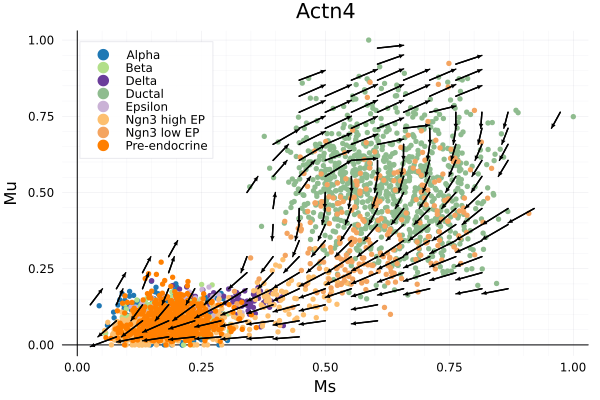

In [23]:
p1 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, xlabel = "Ms", ylabel = "Mu", title = "Actn4", color = palattes[label])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [24]:
idx2 = findfirst(x -> x == "Pax4", genes)

1014

In [25]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([-0.005376799238403132 0.05263157894736842; 0.025849842612148722 0.05263157894736842; … ; -0.052631578947368474 -0.006723032947199797; -0.052631578947368474 -0.03929071309352413], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.13157894736842105; 0.9736842105263157 0.4473684210526315])

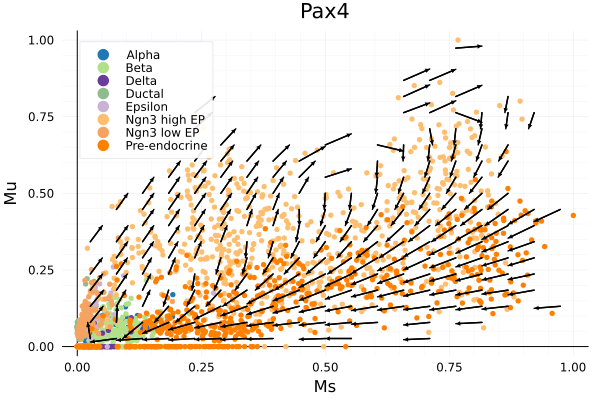

In [26]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, xlabel = "Ms", ylabel = "Mu", title = "Pax4", color = palattes[label])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [27]:
idx3 = findfirst(x -> x == "Slc2a2", genes)

794

In [28]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([-0.004127982055809411 0.05263157894736842; 0.02720899929405601 0.05263157894736842; … ; -0.002805756479664235 -0.052631578947368474; 0.0009488022189467729 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.9210526315789473; 0.9736842105263157 0.9736842105263157])

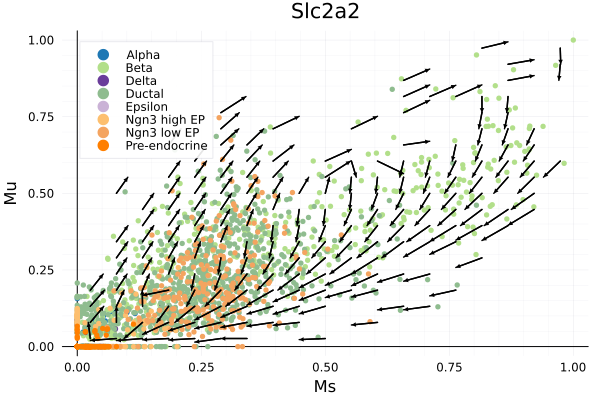

In [29]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, xlabel = "Ms", ylabel = "Mu", title = "Slc2a2", color = palattes[label])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

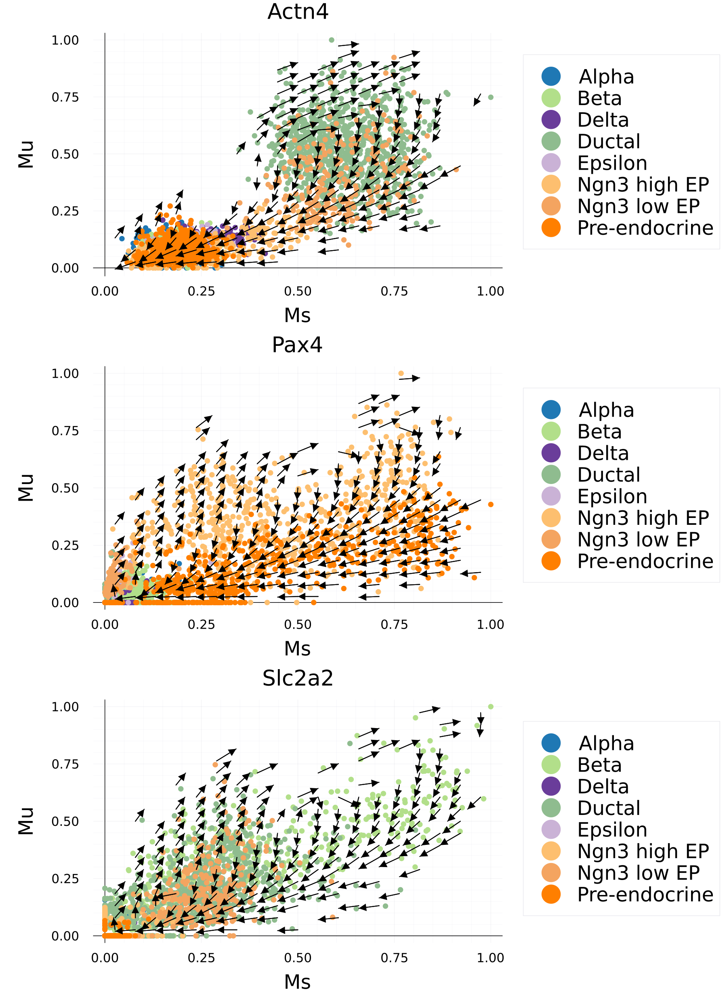

In [30]:
p = plot(p1, p2, p3, layout = (3, 1), size = (1200, 1650), dpi = 150, left_margins = 1.5Plots.cm, legendfontsize = 22, markersize = 5, legend = :outerright, 
    titlefontsize = 24, xtickfontsize = 14, ytickfontsize = 14, xguidefontsize = 22, yguidefontsize = 22)

In [31]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/pancreas/figure/JuloVelo_velocity_vector.png"

## Kinetics embedding

In [32]:
kinetics_embedding(adata; basis = "umap", min_dist = 0.5, n_neighbors = 100);

In [33]:
embedding = adata.obsm["kinetics_umap"];

In [34]:
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype))

8-element Vector{String}:
 "Alpha"
 "Beta"
 "Delta"
 "Ductal"
 "Epsilon"
 "Ngn3 high EP"
 "Ngn3 low EP"
 "Pre-endocrine"

In [35]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

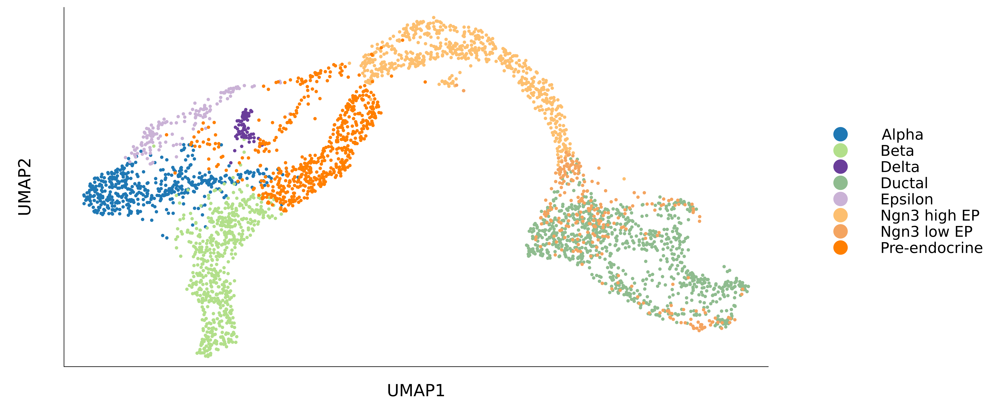

In [36]:
p = scatter(size = (1600, 650), fg_legend = :transparent, left_margins = 2.0Plots.cm, bottom_margins = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, legend=:outerright, legendfontsize = 16, color = palattes[label]
        , xlabel = "UMAP1", ylabel = "UMAP2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [37]:
savefig(p, "figure/pancreas_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/pancreas/figure/pancreas_kinetic_embedding.png"